In [1]:
import itertools

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from IPython.core.interactiveshell import InteractiveShell
from kneed import KneeLocator
from sklearn import metrics
from sklearn.cluster import DBSCAN, AgglomerativeClustering, KMeans, SpectralClustering
from sklearn.decomposition import PCA
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import StandardScaler

sns.set(style="white")
pd.options.display.float_format = "{:,.2f}".format
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
InteractiveShell.ast_node_interactivity = "all"

In [2]:
import warnings

warnings.filterwarnings("ignore")

Данные взяты из [соревнования kaggle](https://www.kaggle.com/arjunbhasin2013/ccdata)

Описание колонок:
- **CUSTID** : ID кредитной карты
- **BALANCE** : Количество суммы оставшейся на карте для покупки
- **BALANCE_FREQUENCY** : Как часто `Balance` обновляется, значение между $0$ (не часто) и $1$ (часто)
- **PURCHASES** : Количество покупок совершенных с аккаунта
- **ONEOFF_PURCHASES** : Максимальное количество покупок пройденных за раз
- **INSTALLMENTS_PURCHASES** : Количество покупок в рассрочку
- **CASH_ADVANCE** : Сумма внесена заранее
- **PURCHASES_FREQUENCY** :  Как часто выполняются покупки, значение между $0$ (не часто) и $1$ (часто)
- **ONEOFF_PURCHASES_FREQUENCY** : Как часто выполняются покупки за раз, значение между $0$ (не часто) и $1$ (часто)
- **PURCHASES_INSTALLMENTS_FREQUENCY** : Как часто выполняются покупки в рассрочку, значение между $0$ (не часто) и $1$ (часто)
- **CASH_ADVANCE_FREQUENCY** : Как часто пользователь вносит деньги заранее, значение между $0$ (не часто) и $1$ (часто)
- **CASH_ADVANCE_TRX** : Количество транзакций с деньгами внесенными заранее
- **PURCHASES_TRX** : Количество покупок
- **CREDIT_LIMIT** : Лимит карты
- **PAYMENTS** : Сумма потраченная
- **MINIMUM_PAYMENTS** : Самая минимальная сумма операции
- **PRC_FULL_PAYMENT** : Процент закрытия покупки
- **TENURE** : Срок кредитной карты

In [3]:
PATH_NAME = 'CC GENERAL.csv'
INDEX_COL = 'CUST_ID'
RANDOM_STATE = 0

data = pd.read_csv(PATH_NAME, index_col=INDEX_COL)
data.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
CUST_ID,,,,,,,,,,,,,,,,,
C10001,40.90,0.82,95.40,0.00,95.40,0.00,0.17,0.00,0.08,0.00,0,2,"1,000.00",201.80,139.51,0.00,12
C10002,"3,202.47",0.91,0.00,0.00,0.00,"6,442.95",0.00,0.00,0.00,0.25,4,0,"7,000.00","4,103.03","1,072.34",0.22,12
C10003,"2,495.15",1.00,773.17,773.17,0.00,0.00,1.00,1.00,0.00,0.00,0,12,"7,500.00",622.07,627.28,0.00,12
C10004,"1,666.67",0.64,"1,499.00","1,499.00",0.00,205.79,0.08,0.08,0.00,0.08,1,1,"7,500.00",0.00,NaN,0.00,12
C10005,817.71,1.00,16.00,16.00,0.00,0.00,0.08,0.08,0.00,0.00,0,1,"1,200.00",678.33,244.79,0.00,12


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8950 entries, C10001 to C19190
Data columns (total 17 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   BALANCE                           8950 non-null   float64
 1   BALANCE_FREQUENCY                 8950 non-null   float64
 2   PURCHASES                         8950 non-null   float64
 3   ONEOFF_PURCHASES                  8950 non-null   float64
 4   INSTALLMENTS_PURCHASES            8950 non-null   float64
 5   CASH_ADVANCE                      8950 non-null   float64
 6   PURCHASES_FREQUENCY               8950 non-null   float64
 7   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 8   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 9   CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 10  CASH_ADVANCE_TRX                  8950 non-null   int64  
 11  PURCHASES_TRX                     8950 non-null   int64  
 12  CRED

In [5]:
columns = data.columns
columns

Index(['BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES', 'ONEOFF_PURCHASES',
       'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 'PURCHASES_FREQUENCY',
       'ONEOFF_PURCHASES_FREQUENCY', 'PURCHASES_INSTALLMENTS_FREQUENCY',
       'CASH_ADVANCE_FREQUENCY', 'CASH_ADVANCE_TRX', 'PURCHASES_TRX',
       'CREDIT_LIMIT', 'PAYMENTS', 'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT',
       'TENURE'],
      dtype='object')

# Распределение данных

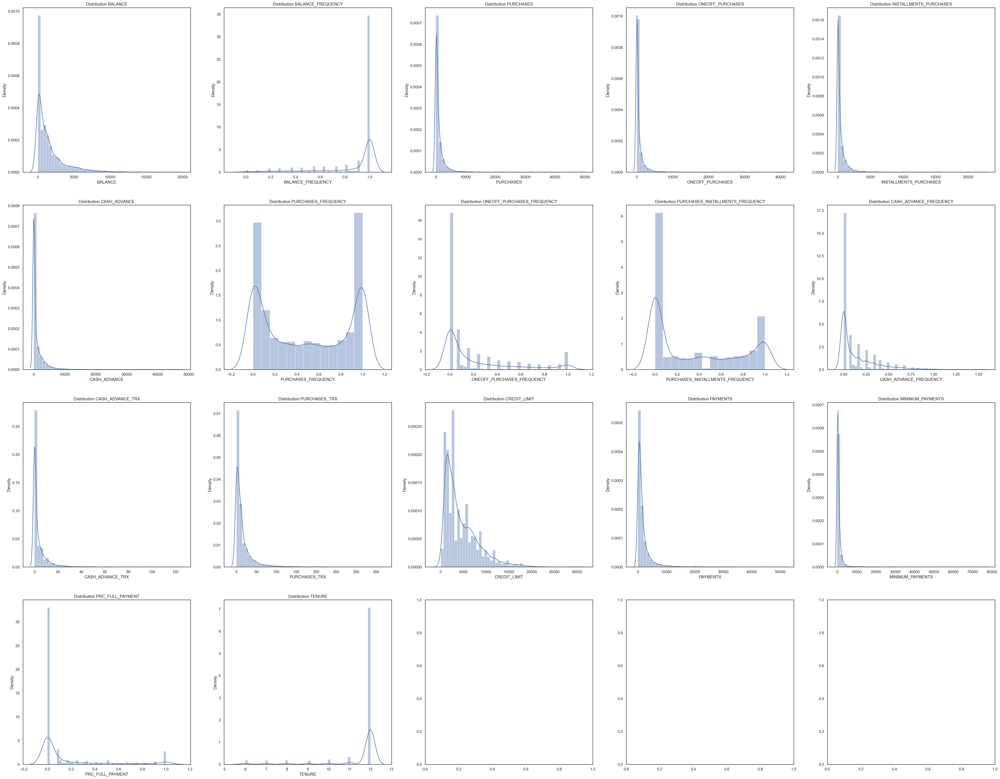

In [6]:
n_columns = 5
n_rows = len(columns) // n_columns if len(columns) % n_columns == 0 else len(columns) // n_columns + 1

fig, axes = plt.subplots(n_rows, n_columns, figsize=(n_columns * 10, n_rows * 10))

for n_feature, feature in enumerate(columns):
    n_row = n_feature // n_columns
    n_column = n_feature % n_columns
    
    axes[n_row, n_column] = sns.distplot(ax=axes[n_row, n_column], a=data[feature], kde=True)
    title = axes[n_row, n_column].set_title(f'Distribution {feature}')

По распределениям можно увидеть сильно ассиметричные данные, поэтому мы производим логистическую трансформацию на следующих колонках: `BALANCE`, `PURCHASES`, `ONEOFF_PURCHASES`, `INSTALLMENTS_PURCHASES`, `CASH_ADVANCE`, `CASH_ADVANCE_TRX`, `PURCHASES_TRX`, `CREDIT_LIMIT`, `PAYMENTS`, `MINIMUM_PAYMENTS`

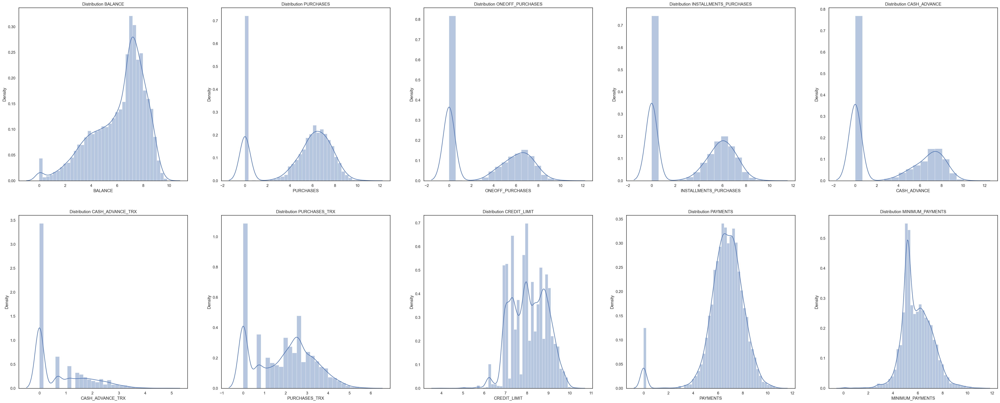

In [7]:
skewed_features = ['BALANCE', 'PURCHASES', 'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 
                   'CASH_ADVANCE_TRX', 'PURCHASES_TRX', 'CREDIT_LIMIT', 'PAYMENTS', 'MINIMUM_PAYMENTS']

n_columns = 5
n_rows = len(skewed_features) // n_columns if len(skewed_features) % n_columns == 0 else len(skewed_features) // n_columns + 1

fig, axes = plt.subplots(n_rows, n_columns, figsize=(n_columns * 10, n_rows * 10))

for n_feature, feature in enumerate(skewed_features):
    n_row = n_feature // n_columns
    n_column = n_feature % n_columns
    
    data[feature] = np.log(1 + data[feature])
    
    axes[n_row, n_column] = sns.distplot(ax=axes[n_row, n_column], a=data[feature], kde=True)
    title = axes[n_row, n_column].set_title(f'Distribution {feature}')

# Пропущенные значения

In [8]:
features_with_nan = pd.DataFrame({'missing %': data.isnull().sum() * 100 / len(data)})
features_with_nan = features_with_nan[features_with_nan['missing %'] > 0]
features_with_nan

correlation = data[columns].corr(method='spearman')
correlation = correlation[features_with_nan.index].unstack()
pd.DataFrame(correlation[(correlation > .7) & (correlation < 1)], columns=['correlation %'])

,missing %
CREDIT_LIMIT,0.01
MINIMUM_PAYMENTS,3.50


,,correlation %
MINIMUM_PAYMENTS,BALANCE,0.90


У признака `CREDIT_LIMIT` нет высоко-коррелируемых параметров, таким образов пустые значения заполнятся средним значением. Тогда как, признак `MINIMUM_PAYMENTS` будет заполняться в зависимости от признака `BALANCE`.

In [9]:
data[features_with_nan.index].describe().T

data.sort_values(by='BALANCE', inplace=True)

data['CREDIT_LIMIT'].fillna(data['CREDIT_LIMIT'].mean(), inplace=True)
data['MINIMUM_PAYMENTS'].fillna(method='bfill', inplace=True)

data[features_with_nan.index].describe().T

,count,mean,std,min,25%,50%,75%,max
CREDIT_LIMIT,"8,949.00",8.09,0.82,3.93,7.38,8.01,8.78,10.31
MINIMUM_PAYMENTS,"8,637.00",5.92,1.19,0.02,5.14,5.75,6.72,11.24


,count,mean,std,min,25%,50%,75%,max
CREDIT_LIMIT,"8,950.00",8.09,0.82,3.93,7.38,8.01,8.78,10.31
MINIMUM_PAYMENTS,"8,950.00",5.87,1.23,0.02,5.12,5.70,6.68,11.24


# Нормализация данных

In [10]:
scale = StandardScaler()
train_data = scale.fit_transform(data)

distance = 1 - cosine_similarity(train_data)
pca = PCA(n_components=2)
visualise_data = pca.fit_transform(distance)

# K-Means

Пытаемся определить оптимальное количество кластеров с помощью методов локтя

10

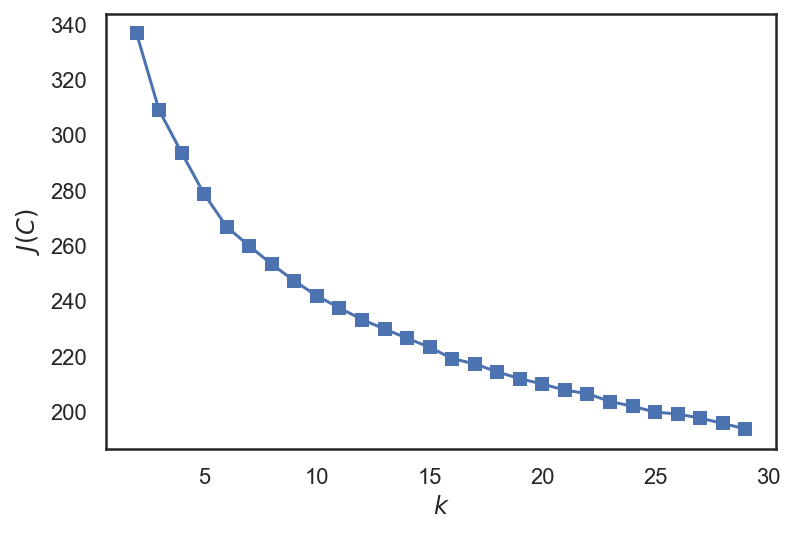

In [11]:
inertia = []
for k in range(2, 30):
    k_means = KMeans(n_clusters=k, random_state=RANDOM_STATE).fit(train_data)
    inertia.append(np.sqrt(k_means.inertia_))

fig = plt.plot(range(2, 30), inertia, marker='s')
fig = plt.xlabel('$k$')
fig = plt.ylabel('$J(C)$')

kl = KneeLocator(range(2, 30), inertia, curve='convex', direction='decreasing')
n_clusters = kl.elbow
n_clusters

Получаем оптимальное количество кластеров $10$.

In [12]:
kmeans_model = KMeans(n_clusters=n_clusters, init='k-means++')
kmeans_labels = kmeans_model.fit_predict(train_data)

data['KMEANS.labels'] = kmeans_labels

# Agglomerative clustering

In [13]:
agglomerative_model = AgglomerativeClustering(n_clusters=n_clusters, linkage='ward')
agglomerative_labels = agglomerative_model.fit_predict(train_data)

data['AGGLOMERATIVE_CLUSTERING.labels'] = agglomerative_labels

# DBSCAN

`eps` находим через $k$-nearest neibours.

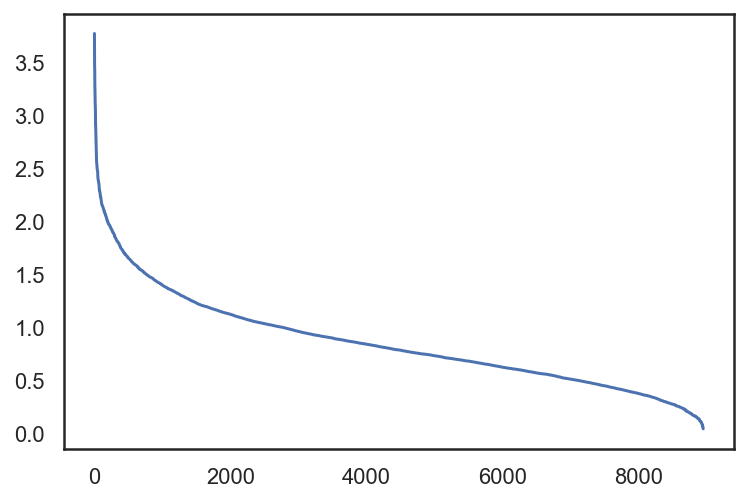

In [14]:
neighbors = NearestNeighbors(n_neighbors=2).fit(train_data)
distances, indices = neighbors.kneighbors(train_data)

distances = np.sort(distances[:, -1].flatten())[::-1]
fig = plt.plot(distances)

In [15]:
eps = 1.75
min_samples = 6

dbscan_model = DBSCAN(eps=eps, min_samples=min_samples)
dbscan_labels = dbscan_model.fit_predict(train_data)

data['DBSCAN.labels'] = dbscan_labels

# Spectral Clustering

In [16]:
spectral_model = SpectralClustering(n_clusters=n_clusters, affinity='rbf')
spectral_labels = spectral_model.fit_predict(train_data)

data['SPECTRAL_CLUSTERING.labels'] = spectral_labels

# Comparison

<Figure size 2880x720 with 0 Axes>

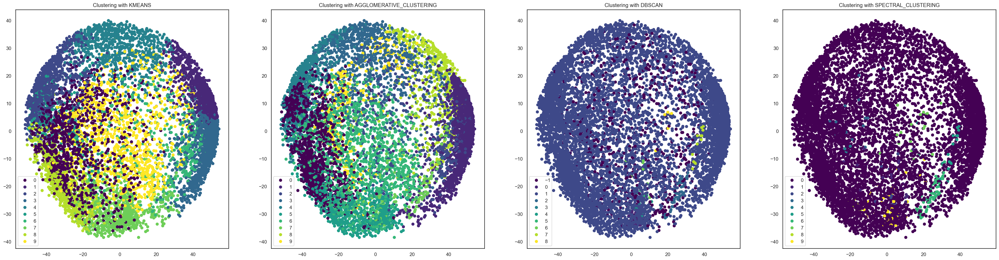

In [17]:
algorithms = ['KMEANS', 'AGGLOMERATIVE_CLUSTERING', 'DBSCAN', 'SPECTRAL_CLUSTERING']

n_columns, n_rows = len(algorithms), 1
plt.figure(figsize=(n_columns * 10, n_rows * 10))

for n_plot, algorithm in enumerate(algorithms):
    fig = plt.subplot(n_rows, n_columns, n_plot + 1)
    
    fig = plt.scatter(x=visualise_data[:, 0], y=visualise_data[:, 1], c=data[f'{algorithm}.labels'], cmap='viridis')
    legend = plt.legend(handles=fig.legend_elements()[0], labels=fig.legend_elements()[1])
    title = plt.title(f'Clustering with {algorithm}')

In [18]:
n_columns = len(algorithms)
n_rows = len(columns)

fig, axes = plt.subplots(n_rows, n_columns, figsize=(n_columns * 10, n_rows * 10))

for n_feature, feature in enumerate(columns):
    for n_algorithm, algorithm in enumerate(algorithms):
        target = f'{algorithm}.labels'
        for value in data[target].unique():
            kde = sns.kdeplot(data[data[target]==value][feature], ax=axes[n_feature, n_algorithm])
            legend = axes[n_feature, n_algorithm].legend(labels=data[target].unique())
            title = axes[n_feature, n_algorithm].set_title(f'{feature} distribution based on {target}')

Виды метрик для определения эффективности кластеризации[[1]](https://scikit-learn.org/stable/modules/clustering.html#clustering-performance-evaluation):

<ul>
    <li> <details>
        <summary> <b>Rand Index <a href=https://scikit-learn.org/stable/modules/generated/sklearn.metrics.rand_score.html>[2]</a></b> </summary> Нужно иметь правильные значения кластеризации <code>labels_true</code>. <b>Rand Index</b> считает <b>схожесть</b> двух обозначений, игнорируя перестановки. Значение 1 это максимальное значение; чем меньше, тем хуже, но не обязательно будет близко к 0. <br><br> Если $C$ является правильными лейблами и $K$ результат кластеризации: $a$ - количество пар в одном сете в $C$ и в таком же сете в $K$; $b$ - количество пар в разных сетах в $C$ и в $K$ $$RI = \frac{a+b}{C_2^{n_{samples}}}$$ где $C_2^{n_{samples}}$ все возможное количество пар.
        </details>
    </li>
    <li> <details>
        <summary> <b>Adjusted Rand Index <a href=https://scikit-learn.org/stable/modules/generated/sklearn.metrics.adjusted_rand_score.html>[3]</a></b> </summary> принимает во внимание возможность расстановки кластеров рандомно. Значение 1 это максимальное значение; плохие значения близки к 0 или отрицательные. <br><br> $$ARI = \frac{RI - E[RI]}{\max(RI) - E[RI]}$$
        </details>
    </li>
    <li> <details>
        <summary> <b> Mutual Information <a href=https://scikit-learn.org/stable/modules/generated/sklearn.metrics.mutual_info_score.html>[4]</a></b> </summary> Нужно иметь правильные значения кластеризации <code>labels_true</code>. <b>Mutual Information</b> считает <b>согласие</b> двух обозначений, игнорируя перестановки. Лучшее значение не будет 1, отрицательные значения для плохих результатов. <br><br> Предположим два результата кластеризации ($N$ объектов) $U$ и $V$ $$H(U) = -\sum_{i=1}^{|U|}P(i)\log(P(i)), \quad P(i) = |U_i|/N$$ $$H(V) = -\sum_{j=1}^{|V|}P'(j)\log(P'(j)), \quad P'(i) = |V_j|/N$$ $$MI(U,V) = \sum_{i=1}^{|U|} \sum_{j=1}^{|V|} P(i,j)\log \left( \frac{P(i, j)}{P(i) P'(j)} \right), \quad P(i, j)=|U_i \cap V_j|/N$$
        </details>
    </li>
    <li> <details>
        <summary> <b> Normalized Mutual Information (NMI) <a href=https://scikit-learn.org/stable/modules/generated/sklearn.metrics.normalized_mutual_info_score.html>[5]</a></b> </summary> Лучшее значение 1, отрицательные значения для плохих результатов. <br> $$NMI(U, V) = \frac{MI(U, V)}{mean(H(U), H(V))}$$
        </details>
    </li>
    <li> <details>
        <summary> <b> Adjusted Mutual Information (AMI) <a href=https://scikit-learn.org/stable/modules/generated/sklearn.metrics.adjusted_mutual_info_score.html>[6]</a></b> </summary> Лучшее значение 1, отрицательные значения для плохих результатов. <br> $$E[MI(U, V)] = \sum_{i=1}^{|U|} \sum_{j=1}^{|V|} \sum_{n_{ij}=(a_i+b_j-N)^+}^{\min(a_i, b_j)} \frac{n_{ij}}{N} \log \left( \frac{N.n_{ij}}{a_ib_j} \right) \frac{a_i!b_j! (N-a_i) !(N-b_j) !}{N!n_{ij}!(a_i-n_{ij})! (N-a_i-b_j+n_{ij})!}$$ $$AMI = \frac{MI - E[MI]}{mean(H(U), H(V)) - E[MI]}$$
        </details>
    </li>
    <li> <details>
        <summary> <b> Homogeneity <a href=https://scikit-learn.org/stable/modules/generated/sklearn.metrics.homogeneity_score.html>[7]</a></b> </summary> Нужно иметь правильные значения кластеризации <code>labels_true</code>. Каждый кластер имеет точки одного класса. Граница $[0, 1]$ <br> $$h = 1 - \frac{H(C|K)}{H(C)},\quad H(C|K) = - \sum_{c=1}^{|C|} \sum_{k=1}^{|K|} \frac{n_{c,k}}{n} \log \left( \frac{n_{c,k}}{n_k} \right)$$ $$H(C) = - \sum_{c=1}^{|C|} \frac{n_c}{n} \log (\frac{n_c}{n})$$
        </details>
    </li>
    <li> <details>
        <summary> <b> Completeness <a href=https://scikit-learn.org/stable/modules/generated/sklearn.metrics.completeness_score.html>[8]</a></b> </summary> Нужно иметь правильные значения кластеризации <code>labels_true</code>. Все точки одного класса обозначены к одному кластеру. Граница $[0, 1]$ <br> $$c = 1 - \frac{H(K|C)}{H(K)},\quad H(K|C) = - \sum_{k=1}^{|K|} \sum_{c=1}^{|C|} \frac{n_{k,c}}{n} \log \left( \frac{n_{k,c}}{n_c} \right)$$ $$H(K) = - \sum_{k=1}^{|K|} \frac{n_k}{n} \log (\frac{n_k}{n})$$
        </details>
    </li>
    <li> <details>
        <summary> <b> V-measure <a href=https://scikit-learn.org/stable/modules/generated/sklearn.metrics.v_measure_score.html>[9]</a></b> </summary> Гармоническое среднее от Homogeneity и Completeness. Параметр $\beta$ влияет на важность, чем выше важнее Completeness, если меньше то важнее Homogeneity <br> $$v = \frac{(1 + \beta) \times h \times c}{\beta \times h + c}$$
        </details>
    </li>
    <li> <details>
        <summary> <b> Fowlkes-Mallows scores <a href=https://scikit-learn.org/stable/modules/generated/sklearn.metrics.fowlkes_mallows_score.html>[10]</a></b> </summary> Нужно иметь правильные значения кластеризации <code>labels_true</code>. Границы $[0, 1]$ $$FMI = \frac{TP}{\sqrt{(TP + FP)(TP+FN)}}$$
        </details>
    </li>
    <li> <details>
        <summary> <b> Silhouette Coefficient <a href=https://scikit-learn.org/stable/modules/generated/sklearn.metrics.silhouette_score.html>[11]</a></b> </summary> Оценка производится на самой модели. <br><br> $a$ - среднее расстояние между точкой и всеми остальными точками кластера; $b$ - среднее растояние между точкой и всеми остальными точками самого ближайшего кластера. $$s = \sum_{i=1}^N \frac{b_i - a_i}{N \max(a_i, b_i)}$$
        </details>
    </li>
    <li> <details>
        <summary> <b> Calinski-Harabasz Index <a href=https://scikit-learn.org/stable/modules/generated/sklearn.metrics.calinski_harabasz_score.html>[12]</a></b> </summary> Оценка производится на самой модели. Чем выше значения, тем лучше. <br><br> Для сета $E$ размером $n_E$ с $k$ кластерами в результате: $$s = \frac{tr(B_k)}{tr(W_k)} \times \frac{n_E - k}{k - 1}$$ where $tr(B_k)$ след дисперсии между кластерами, $tr(B_k)$ след дисперсии внутри кластера. $$W_k = \sum_{q=1}^k \sum_{x \in C_q} (x-c_q)(x-c_q)^T$$ $$B_k = \sum_{q=1}^k n_q(c_q - c_E)(c_q-c_E)^T$$ где $C_q$ сет точек кластера $q$, $c_q$ центроид кластера $q$, $c_E$ центроид кластела $E$ и $n_q$ количество точек в кластере $q$
        </details>
    </li>
    <li> <details>
        <summary> <b> Davies-Bouldin Index <a href=https://scikit-learn.org/stable/modules/generated/sklearn.metrics.davies_bouldin_score.html>[13]</a></b> </summary> Оценка производится на самой модели. Чем ниже значения, тем лучше. <br><br> Средняя схожесть между каждым кластером $C_i$ для $i = 1,\dots,k$ с помощью $s_i$ - среднее расстояние между каждым кластером $i$ и центроидом этого кластера; $d_{ij}$ расстояние между центроидами кластера $i$ и $j$ $$R_{ij} = \frac{s_i + s_j}{d_{ij}}$$ $$DB = \frac{1}{k} \sum_{i=1}^k \max_{i \neq j} R_{ij}$$
        </details>
    </li>
</ul>

In [19]:
scores = []

for algorithm in algorithms:
    target = f'{algorithm}.labels'
    silhouette_score = metrics.silhouette_score(
        data[columns], data[target], metric='euclidean')
    calinski_harabasz_score = metrics.calinski_harabasz_score(
        data[columns], data[target])
    davies_bouldin_score = metrics.davies_bouldin_score(
        data[columns], data[target])

    scores.append((silhouette_score,
                  calinski_harabasz_score, davies_bouldin_score))

pd.DataFrame(scores, columns=['Silhouette Coefficient',
             'Calinski-Harabasz Index', 'Davies-Bouldin Index'], index=algorithms)

,Silhouette Coefficient,Calinski-Harabasz Index,Davies-Bouldin Index
KMEANS,0.10,"1,932.71",1.92
AGGLOMERATIVE_CLUSTERING,0.18,"1,874.18",1.74
DBSCAN,-0.11,41.75,1.91
SPECTRAL_CLUSTERING,-0.10,45.47,1.56


**Итог**

| Название | Плюсы | Минусы |
| :-------- | :---- | :----- |
| Rand Index | - в unadjusted Rand Index результат порпорционален числу пар значений с одинаковыми лейблами или разными;<br> - у рандомныы лейблов значение будет близко к 0 для adjusted Rand Index;<br> - сформированные границы значений<br> - никаких допущений не сделано о структуре кластеров | - нужно иметь `labels_true`;<br> - значений unadjusted Rand Index очень часто близки к 1, из-за пересечения класса "другой".|
| Mutual Information | - рандомный лейблинг имеют AMI близко к 0;<br> - верхняя граница значений 1. | - нужно иметь `labels_true`;<br> - NMI и MI не нормализован к рандому|
| Homogeneity, Completeness, V-measure | - границы значений;<br> - интуитивная интерпретация;<br> - нет предположения о структуре кластеров. | - не учитывает рандомную кластеризацию (такие зн-ия не будут 0);<br> - нужно иметь `labels_true`|
| Fowlkes-Mallows scores | - рандомая кластеризация всегда будет близка к 0;<br> - граница значений;<br> - нет предположения о структуре кластеров | - нужно иметь `labels_true`.|
| Silhouette Coefficient | - граница $[-1, 1]$, 1 - идеальный результат. | - чаще выше для выпуклых кластеров. |
| Calinski-Harabasz Index | - быстро считается;<br> - выше для плотных кластеров.| - чаще выше для выпуклых кластеров. |
| Davies-Bouldin Index | - быстро считается;<br> - использует во внимание только дистанцию. | - чаще выше для выпуклых кластеров;<br> - использование расстояния лимитируется euclidean.|